<a href="https://colab.research.google.com/github/sakethyalamanchili/Dog-Breed-Identification-with-TensorFlow/blob/main/Dog_Breed_Identification_with_TensorFlow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **🐶 Dog Breed Identification with TensorFlow**

## 1. Problem
> We're developing a machine learning model for multi-class image classification to identify various dog breeds from images. This task has wide-ranging applications, including autonomous driving and image tagging. Our aim is to precisely recognize the breed of a dog from a given photo.

## 2. Data
> Using data from Kaggle's dog breed identification competition, which includes over 10,000 labeled images of 120 breeds, we'll train the model to classify images into specific breeds. https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
> We use Multi-Class Log Loss to see how well our model's predictions match the actual dog breeds in the images. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
> Some information about the data:
1. **Type of Data:** Images (unstructured data)
2. **Approach:** Deep learning/transfer learning is recommended due to the nature of the data.
3. **Number of Classes:** 120 different dog breeds.
4. **Training Set:** Contains over 10,000 labeled images.
5. **Test Set:** Contains over 10,000 unlabeled images for prediction.

In [1]:
# Importing all neccessary tools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from IPython.display import Image
import os
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_hub as hub

In [2]:
# # Unzip the uploaded data into Google Drive
# !unzip '/content/drive/MyDrive/Dog-Vision-prj/dog-breed-identification.zip' -d '/content/drive/MyDrive/Dog-Vision-prj'

## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

In [3]:
labels_csv = pd.read_csv("drive/MyDrive/Dog-Vision-prj/labels.csv")
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [4]:
train_valid = os.listdir("drive/MyDrive/Dog-Vision-prj/train/")
train_valid[:10]

['e5f1325af86723ad733000ca2adbd226.jpg',
 'e5d36dcf26d2f478531b1702508b13aa.jpg',
 'e67eb5ae1ff58374b0e07398d5a0da5a.jpg',
 'e8e113dfd19ec90776c74b9105f3c29a.jpg',
 'e93aa36e6a6951470a703ffb9020e9c4.jpg',
 'e86a88391d017cc3807cc9653a4a7290.jpg',
 'e89e6cbb5d616ef9904675b9e6db06b3.jpg',
 'e970fc0099be12ed7544a6eee8e3a9db.jpg',
 'e81c8db07ad9b5291435e3aa3ac728bf.jpg',
 'e7af8f590b4fbdca0779f5e606ef91a1.jpg']

In [5]:
filenames = ["drive/MyDrive/Dog-Vision-prj/train/" + fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]

['drive/MyDrive/Dog-Vision-prj/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Vision-prj/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

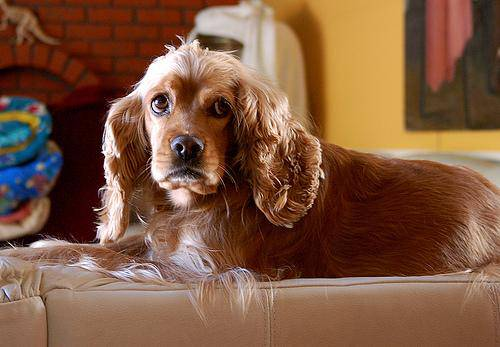

In [6]:
Image(filenames[5555])

In [7]:
if len(train_valid) == len(filenames):
  print(f"Length is {len(filenames)}")
else:
  print(f"Images Corrupted...")

Length is 10222


In [8]:
labels_csv['breed'][10]

'shetland_sheepdog'

In [9]:
# We have to convert the data into Tensors ~ NumPy Arrays
labels = labels_csv['breed'].to_numpy()
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [10]:
unique_labels = np.unique(labels)
len(unique_labels)

120

In [11]:
# Now onehotencode `labels`
boolean_labels = [label == unique_labels for label in labels]
print(labels[1000])
print(boolean_labels[1000].argmax())
print(boolean_labels[1000].astype(int))

irish_setter
56
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [12]:
# Split the features
X = filenames
y = boolean_labels

NUM_IMAGES = 1000

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

# As it is in array, shape doesn't work, so let's use len
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [13]:
X_train[:5], y_train[:5]

(['drive/MyDrive/Dog-Vision-prj/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-Vision-prj/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog-Vision-prj/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog-Vision-prj/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog-Vision-prj/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, F

## Turning images into Tensors

array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]],

       [[ 58,  38,  29],
        [ 58,  38,  27],
        [ 57,  37,  26],
        ...,
        [ 60,  33,  12],
        [ 53,  26,   5],
        [ 63,  36,  15]],

       ...,

       [[192, 110,  34],
        [183, 104,  29],
        [183, 103,  34],
        ...,
        [ 52,  26,  27],
        [ 34,   8,   9],
        [ 21,   0,   0]],

       [[181,  99,  23],
        [200, 121,  46],
        [207, 127,  58],
        ...,
        [ 35,   7,   6],
        [ 59,  29,  29],
        [ 88,  60,  57]],

       [[182, 100,  24],
        [203, 124,  49],
        [216, 136,  67],
        ...,
        [ 38,   9,   5],
        [116,  85,  80],
        [192, 163, 155]]], dtype=uint8)
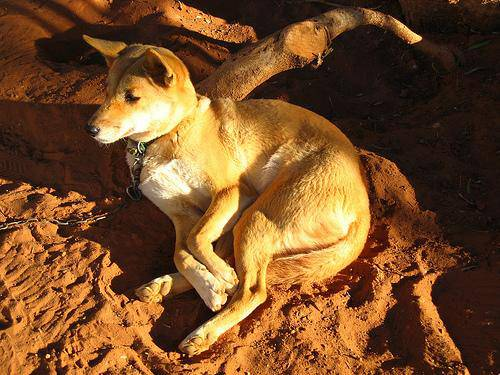

In [14]:
imread(X[1])

array([[[120, 134, 145],
        [ 21,  33,  49],
        [  0,   0,  25],
        ...,
        [ 37,  22,  17],
        [ 31,  16,  11],
        [ 26,  11,   6]],

       [[125, 139, 150],
        [ 26,  38,  52],
        [  0,   3,  28],
        ...,
        [ 29,  14,   9],
        [ 24,   9,   4],
        [ 20,   5,   0]],

       [[124, 141, 149],
        [ 27,  39,  53],
        [  0,   4,  29],
        ...,
        [ 24,   9,   4],
        [ 22,   7,   2],
        [ 20,   5,   0]],

       ...,

       [[ 14,  29,  24],
        [ 14,  29,  24],
        [ 14,  29,  24],
        ...,
        [  6,  15,  12],
        [  6,  15,  12],
        [  6,  15,  12]],

       [[ 15,  30,  25],
        [ 15,  30,  25],
        [ 15,  30,  25],
        ...,
        [  6,  15,  12],
        [  6,  15,  12],
        [  6,  15,  12]],

       [[ 16,  31,  26],
        [ 16,  31,  26],
        [ 15,  30,  25],
        ...,
        [  6,  15,  12],
        [  6,  15,  12],
        [  6,  15,  12]]], dtype=uint8)
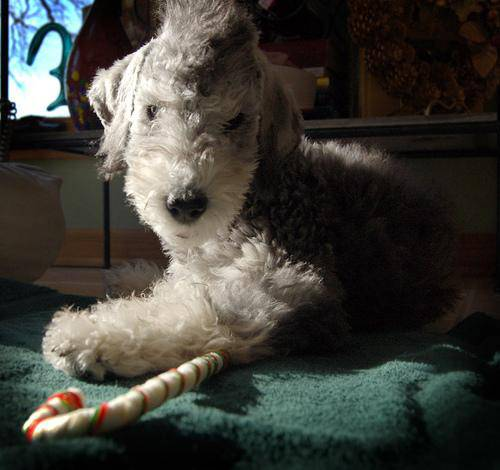

In [15]:
imread(X[6])

## Preprocessing Images (Converting Images to Tensors)

1. **Input**: Accepts an image filepath.
2. **Reading Image**: Using TensorFlow, reads the image file and stores it in a variable called `image`.
3. **Converting to Tensors**: Converts the image (in jpg format) into Tensors.
4. **Normalization**: Normalizes the image by converting color channel values from the range 0-255 to 0-1.
5. **Resizing**: Resizes the image to a shape of (224, 224).
6. **Output**: Returns the modified image.

In [16]:
# Define the size to which images will be resized
IMG_SIZE = 224

# Function to preprocess image data
def updated_image(image_path):
    """
    Preprocesses the image located at the given image_path.

    Parameters:
        image_path (str): The file path of the image.

    Returns:
        TensorFlow tensor: The preprocessed image tensor.
    """
    # Read image file
    image = tf.io.read_file(image_path)

    # Decode JPEG format
    image = tf.image.decode_jpeg(image, channels=3)

    # Convert pixel values to float32 and normalize to range [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)

    # Resize image to specified dimensions
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

    return image

In [17]:
updated_image(X[1]).shape

TensorShape([224, 224, 3])

In [18]:
updated_image(X[6]).shape

TensorShape([224, 224, 3])

In [19]:
# Function to get image and its corresponding label
def get_image_label(image_path, label):
    """
    Loads and preprocesses the image located at the given image_path,
    and associates it with the provided label.

    Parameters:
        image_path (str): The file path of the image.
        label: The label associated with the image.

    Returns:
        tuple: A tuple containing the preprocessed image tensor and its corresponding label.
    """
    # Preprocess the image
    image = updated_image(image_path)

    # Return the preprocessed image and its label
    return image, label

## Batching Data

**Why Batch Data?**

Processing a large number of images all at once might exceed the memory capacity.

**Solution: Batching**

By splitting the dataset into smaller batches, such as 32 images at a time (batch size), we can manage memory usage effectively. You can adjust the batch size manually based on memory constraints and computational efficiency.

**Data Representation in TensorFlow**

To utilize TensorFlow effectively, our data should be organized as Tensor tuples, structured as follows: `(image, label)`.

This structure allows for efficient processing of both the image data and its corresponding labels during training or evaluation.


In [20]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data from the given input and label data.

    Parameters:
        X: Input data (image file paths or image tensors).
        y: Labels associated with the input data.
        batch_size (int): The batch size to use.
        valid_data (bool): Whether the data is for validation.
        test_data (bool): Whether the data is for testing.

    Returns:
        TensorFlow dataset: A dataset containing batches of preprocessed data.
    """
    if test_data:
        print("Creating Testing Data Batches...")
        # Create dataset from image file paths
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
        # Map preprocessing function to dataset and create batches
        data_batch = data.map(updated_image).batch(batch_size)
        return data_batch

    elif valid_data:
        print("Creating Validation Data Batches...")
        # Create dataset from image file paths and labels
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        # Map preprocessing function to dataset and create batches
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

    else:
        print("Creating Training Data Batches...")
        # Create dataset from image file paths and labels
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        # Shuffle the data if it's training data
        data = data.shuffle(buffer_size=len(X))
        # Map preprocessing function to dataset and create batches
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

In [21]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating Training Data Batches...
Creating Validation Data Batches...


In [22]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Now that our data is organized into batches, it might be challenging to comprehend its structure just by looking at the raw batches. Let's visualize them to get a clearer understanding.

We'll use visualization techniques to help us better understand the content and format of these batches, making it easier to grasp how our data is being processed.

In [23]:
def plot_25_images(images, labels):
    """
    Plots 25 images with their corresponding labels.

    Parameters:
        images (list): List of images to plot.
        labels (list): List of labels associated with the images.
    """
    plt.figure(figsize=(10,10))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.title(unique_labels[labels[i].argmax()], fontsize=8, fontweight='bold')
        plt.axis('off')

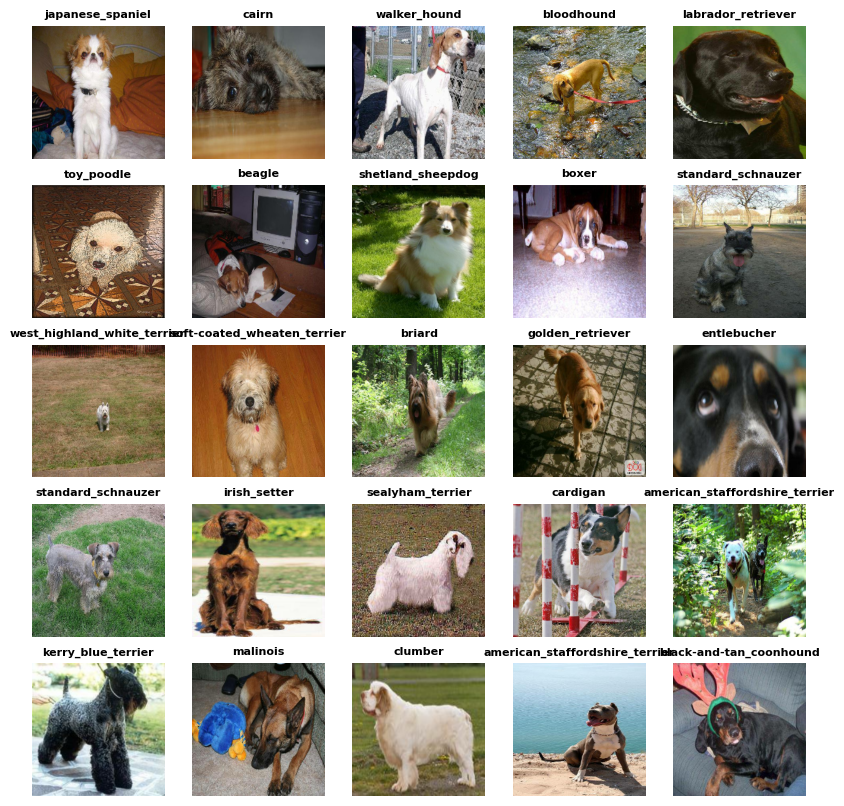

In [24]:
train_images, train_labels = next(train_data.as_numpy_iterator())
plot_25_images(train_images, train_labels)

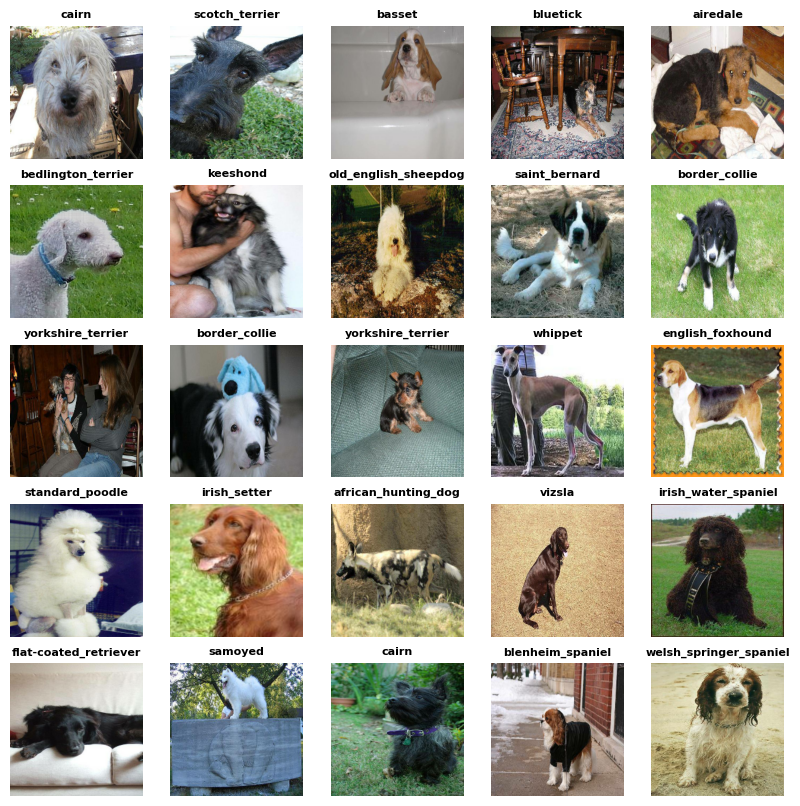

In [25]:
val_images, val_labels = next(val_data.as_numpy_iterator())
plot_25_images(val_images, val_labels)

## Building a Model

In [26]:
# Define input shape, output shape, and model URL
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_labels)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [27]:
# Create a function to build a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    """
    Builds and compiles a Keras model using the specified input shape, output shape, and model URL.

    Parameters:
        input_shape (tuple): The shape of the input data.
        output_shape (int): The number of output classes.
        model_url (str): The URL or path to the pre-trained model.

    Returns:
        tf.keras.Model: The constructed and compiled Keras model.
    """
    print("Building model with:", MODEL_URL)

    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL),  # Layer 1: Pre-trained model as input layer
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")  # Layer 2: Output layer
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),  # Loss function to minimize (categorical cross-entropy)
        optimizer=tf.keras.optimizers.Adam(),  # Optimization algorithm (Adam)
        metrics=["accuracy"]  # Metrics to monitor during training (accuracy)
    )

    # Build the model
    model.build(INPUT_SHAPE)  # Define input shape for the model

    return model

> `softmax` is a mathematical function that converts a vector of numbers into a probability distribution, where the sum of all probabilities is equal to 1. It is commonly used as the activation function in the output layer of neural networks for multi-class classification problems.

## Creating Callbacks

Callbacks are helper functions that a model can use during training to perform tasks such as saving its progress, monitoring its progress, or stopping training early if the model stops improving.

We'll create two callbacks:

1. **TensorBoard Callback**: This helps track our model's progress.
2. **Early Stopping Callback**: This prevents our model from training for too long.

In [28]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [29]:
def create_tensorboard_callback():
    """
    Creates a TensorBoard callback to track the training process.

    Returns:
        tf.keras.callbacks.TensorBoard: TensorBoard callback object.
    """
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("/content/drive/MyDrive/Dog-Vision-prj/logs",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    # Each time we run an experiment, logs will be tracked in a new subdirectory with a timestamp
    return tf.keras.callbacks.TensorBoard(logdir)

In [30]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

In [31]:
NUM_EPOCHS = 100

In [32]:
print("GPU is available!" if tf.config.list_physical_devices('GPU') else "GPU is not available!")

GPU is not available!


In [33]:
def train_model():
    """
    Trains a given model and returns the trained version.

    Returns:
        tf.keras.Model: The trained model.
    """
    # Create a model
    model = create_model()

    # Create TensorBoard callback
    tensorboard_callback = create_tensorboard_callback()

    # Fit the model to the data and monitor validation metrics
    model.fit(
        x=train_data,
        epochs=NUM_EPOCHS,
        validation_data=val_data,
        validation_freq=1,  # Check validation metrics every epoch
        callbacks=[tensorboard_callback, early_stopping]  # Attach callbacks for TensorBoard and early stopping
    )

    return model

In [34]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog-Vision-prj/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [35]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [36]:
# Fit the model to the data
#model = train_model()

In [37]:
# Save our model trained on 1000 images
#save_model(model, suffix="1000-images-mobilenetv2-Adam")

In [38]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog-Vision-prj/models/20240222-17501708624235-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog-Vision-prj/models/20240222-17501708624235-1000-images-mobilenetv2-Adam.h5


In [39]:
# Checking Tensorboard Logs
%tensorboard --logdir /content/drive/MyDrive/Dog-Vision-prj/logs

<IPython.core.display.Javascript object>

In [40]:
# Evaluate the pre-saved model
#model.evaluate(val_data)

In [41]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 256s 42s/step - loss: 1.2754 - accuracy: 0.6900


[1.2753782272338867, 0.6899999976158142]

## Making and evaluating predictions using a trained model

In [42]:
predictions = loaded_1000_image_model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 14s 1s/step


array([[1.4116267e-03, 2.3389459e-04, 3.7470274e-04, ..., 6.3502150e-05,
        7.3413516e-06, 5.8599925e-03],
       [2.0490948e-03, 3.8181082e-04, 3.8257279e-02, ..., 1.0787267e-03,
        4.4150837e-03, 6.2739229e-05],
       [1.7227920e-05, 3.6084556e-04, 5.2837120e-05, ..., 7.1540975e-04,
        3.2763215e-04, 3.9763408e-04],
       ...,
       [5.1211414e-06, 2.8163390e-06, 1.6379996e-05, ..., 2.5815482e-06,
        1.0694084e-04, 3.4033976e-05],
       [1.8231053e-03, 8.4536056e-05, 1.0727018e-04, ..., 1.1883095e-04,
        2.2205277e-05, 7.5720060e-03],
       [4.5848938e-04, 6.2936648e-05, 1.1644848e-03, ..., 3.0629381e-03,
        3.4762971e-04, 4.1235835e-05]], dtype=float32)

In [43]:
predictions.shape

(200, 120)

In [44]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_labels[np.argmax(predictions[0])]}") # the predicted label

[1.41162670e-03 2.33894592e-04 3.74702737e-04 5.73508441e-04
 3.14519333e-04 4.59820549e-05 2.00641453e-02 7.22049735e-04
 1.70383509e-03 4.37640294e-04 7.25930382e-04 9.41292237e-05
 2.29305268e-04 1.83117427e-05 1.16968928e-04 6.30001887e-04
 3.73716284e-05 2.49960542e-01 1.29455393e-05 6.78846482e-05
 4.75695310e-03 4.00790741e-05 2.09458394e-05 1.81379914e-03
 8.31592206e-06 1.34727059e-04 2.76924148e-02 3.51493763e-05
 6.87136489e-04 7.67707708e-04 2.29374273e-04 9.69738408e-04
 2.87203729e-04 5.18084344e-05 4.71181876e-04 5.04752994e-02
 3.05891831e-06 5.25087235e-04 2.73457372e-05 3.67578497e-04
 2.75782100e-03 1.83385346e-05 6.47992201e-05 1.99330680e-04
 1.02713355e-04 1.79423878e-04 1.14439390e-05 9.16827485e-05
 4.28191153e-04 1.33484777e-04 1.45170430e-04 7.93169966e-05
 1.09497597e-03 3.37191777e-05 2.21384849e-04 6.82583195e-05
 1.82643664e-04 4.94523905e-03 3.54859367e-04 8.14781412e-02
 2.02978234e-04 1.36555182e-05 1.78441219e-03 2.13681487e-05
 5.07822959e-04 9.855013

In [45]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_labels[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

In [46]:
def unbatch(data):
    """
    Unbatches the data and extracts images and labels.

    Parameters:
        data: The batched dataset.

    Returns:
        tuple: A tuple containing a list of images and a list of labels.
    """
    images = []
    labels = []

    # Iterate through the unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_labels[np.argmax(label)])  # Convert label to corresponding class name

    return images, labels

# Unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [47]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

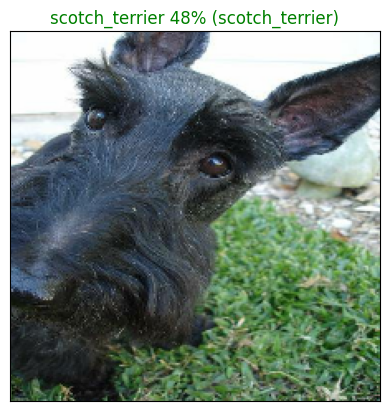

In [48]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [49]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  for i, label in enumerate(top_10_pred_labels):
    if label == true_label:
        top_plot[i].set_color("green")
        break  # Exit the loop once the correct index is found


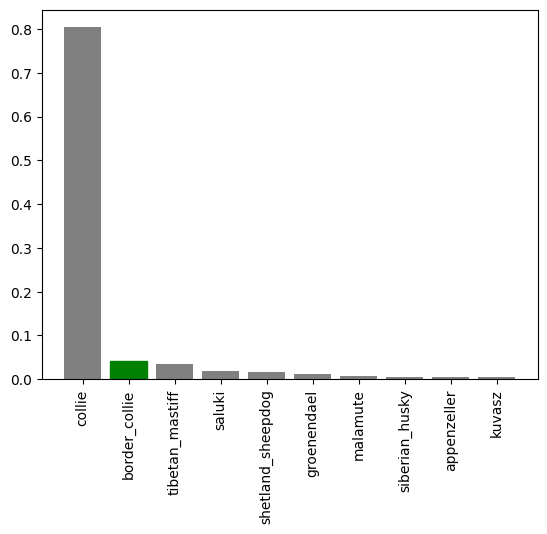

In [50]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

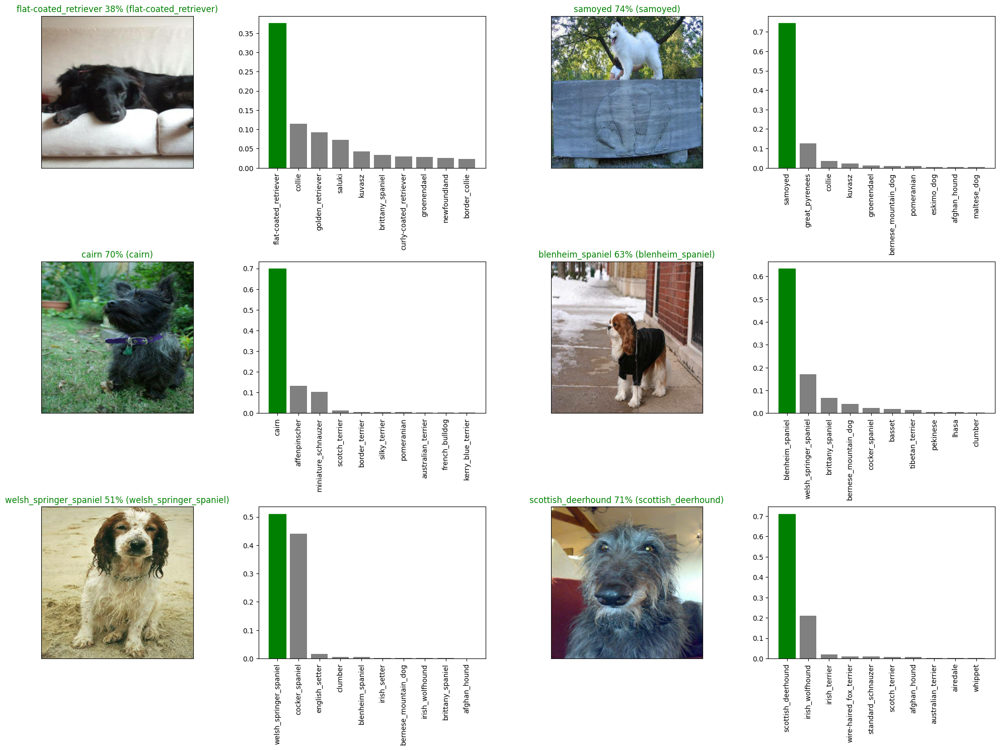

In [51]:
# Define the parameters for plotting predictions
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

# Create a figure to display the predictions
plt.figure(figsize=(10*num_cols, 5*num_rows))

# Iterate through each image and plot its prediction and confidence
for i in range(num_images):
    # Plot the prediction for the current image
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)

    # Plot the prediction confidence for the current image
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)

# Adjust layout to improve spacing between subplots
plt.tight_layout(h_pad=1.0)

# Show the plot
plt.show()

## Training a big dog model 🐶 (on the full data)

In [52]:
#full_data = create_data_batches(X, y)

In [53]:
# full_model = create_model()

# full_model_tensorboard = create_tensorboard_callback()
# full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
#                                                              patience=3)

# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

# save_model(full_model, suffix="full-images-mobilenetv2-Adam")

In [54]:
load_full_model = load_model('/content/drive/MyDrive/Dog-Vision-prj/models/20240223-05511708667513-full-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog-Vision-prj/models/20240223-05511708667513-full-images-mobilenetv2-Adam.h5


## Making predictions on the test dataset

In [55]:
test_path = "drive/MyDrive/Dog-Vision-prj/test/"
test_filepaths = [test_path + fname for fname in os.listdir(test_path)]
test_filepaths[:5]

['drive/MyDrive/Dog-Vision-prj/test/dcccc266ef919edbf3416078edc849db.jpg',
 'drive/MyDrive/Dog-Vision-prj/test/e2915c191c0bc761b795b78f66845fe0.jpg',
 'drive/MyDrive/Dog-Vision-prj/test/e504cbd0094fc72312087587795be597.jpg',
 'drive/MyDrive/Dog-Vision-prj/test/de3fbd6fb5444fcf14390ac90545c2f1.jpg',
 'drive/MyDrive/Dog-Vision-prj/test/e330d9cfe81e42338ddbf8a121930e83.jpg']

In [56]:
test_data = create_data_batches(test_filepaths, test_data=True)

Creating Testing Data Batches...


In [57]:
# test_predictions = load_full_model.predict(x=test_data, verbose=1)
# test_predictions

In [58]:
# Save predictions (NumPy array) to csv file (for access later)
# np.savetxt("drive/MyDrive/Dog-Vision-prj/preds_array.csv", test_predictions, delimiter=",")

In [59]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog-Vision-prj/preds_array.csv", delimiter=",")

In [60]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

In [61]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_labels))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [62]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [63]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dcccc266ef919edbf3416078edc849db,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2915c191c0bc761b795b78f66845fe0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e504cbd0094fc72312087587795be597,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,de3fbd6fb5444fcf14390ac90545c2f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e330d9cfe81e42338ddbf8a121930e83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_labels)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dcccc266ef919edbf3416078edc849db,3.678602e-11,8.488658e-12,1.348065e-11,5.802054e-10,6.967809e-09,1.525417e-05,2.634711e-11,1.640786e-10,1.310426e-10,...,2.374086e-12,3.358447e-13,1.088067e-10,3.400527e-08,3.703698e-12,1.056882e-11,5.064398e-10,8.327097e-11,5.310192e-12,2.882815e-12
1,e2915c191c0bc761b795b78f66845fe0,6.970496e-10,1.907306e-06,3.339039e-09,6.246877e-08,1.021276e-10,4.209743e-08,6.151359e-10,1.850881e-09,1.715318e-09,...,1.476355e-05,3.376827e-09,2.882191e-08,2.332680e-07,7.943078e-08,1.027471e-09,1.434664e-08,1.405718e-05,2.335968e-05,8.274517e-09
2,e504cbd0094fc72312087587795be597,2.090838e-06,4.908095e-08,4.407038e-08,1.418650e-11,8.580081e-08,4.216155e-12,1.182148e-06,1.501880e-08,1.168620e-07,...,5.650520e-03,2.256964e-07,2.215634e-08,8.830343e-06,3.363947e-07,7.780601e-10,1.114100e-02,8.960906e-07,3.876361e-09,2.728081e-07
3,de3fbd6fb5444fcf14390ac90545c2f1,1.017876e-10,3.939891e-12,1.666811e-11,1.867056e-12,2.359395e-06,8.238926e-11,5.448476e-11,4.582922e-07,2.045948e-10,...,2.174861e-11,2.170643e-05,3.011738e-10,5.691288e-10,4.102536e-13,3.064789e-14,4.402531e-12,2.659886e-04,3.334566e-11,1.069364e-12
4,e330d9cfe81e42338ddbf8a121930e83,3.549349e-10,1.057328e-14,5.281584e-12,5.098118e-12,7.598391e-08,1.049346e-09,2.305869e-13,3.309987e-13,1.799742e-14,...,2.758743e-13,4.573599e-10,6.635729e-13,1.427834e-12,3.785412e-13,3.557088e-14,4.473386e-12,1.237894e-11,2.385960e-12,9.656517e-12


In [77]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog-Vision-prj/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

In [66]:
custom_path = "drive/MyDrive/Dog-Vision-prj/images/"
custom_images_filepaths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_images_filepaths

['drive/MyDrive/Dog-Vision-prj/images/Dog - 2.jpg',
 'drive/MyDrive/Dog-Vision-prj/images/Dog - 3.jpg',
 'drive/MyDrive/Dog-Vision-prj/images/Dog - 1.jpg']

In [67]:
custom_data = create_data_batches(custom_images_filepaths, test_data=True)
custom_data

Creating Testing Data Batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [68]:
custom_preds = load_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 2s 2s/step


array([[5.57341451e-10, 2.11914084e-10, 2.21850573e-08, 1.00295390e-08,
        3.83026901e-07, 4.44046790e-08, 3.03541674e-06, 6.43023128e-08,
        3.61684599e-10, 8.14425164e-07, 1.82408033e-10, 8.12924783e-10,
        1.59494363e-07, 6.84432455e-10, 4.36029804e-05, 1.78928588e-08,
        4.09370102e-08, 1.01016121e-06, 1.83593404e-10, 6.30545882e-09,
        1.34714284e-08, 1.64885314e-10, 1.35404093e-07, 3.44439606e-08,
        6.57143806e-09, 2.54828738e-05, 5.73165604e-09, 3.97605845e-06,
        2.34143105e-08, 2.00073430e-07, 6.21756442e-08, 4.46464421e-09,
        1.15640058e-08, 4.10508401e-05, 7.73970193e-11, 1.05284439e-08,
        7.27884413e-04, 9.61082801e-03, 7.42096518e-09, 1.70181966e-10,
        2.69823008e-09, 4.69527572e-09, 2.53283793e-06, 1.26686413e-04,
        7.14699810e-09, 4.11122699e-07, 9.26071346e-01, 5.79394255e-10,
        2.44441734e-09, 5.15812935e-05, 2.05441797e-08, 1.03291979e-08,
        8.71457928e-09, 1.40175118e-07, 3.45685322e-07, 7.161038

In [69]:
custom_preds.shape

(3, 120)

In [70]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'english_foxhound', 'labrador_retriever']

In [71]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

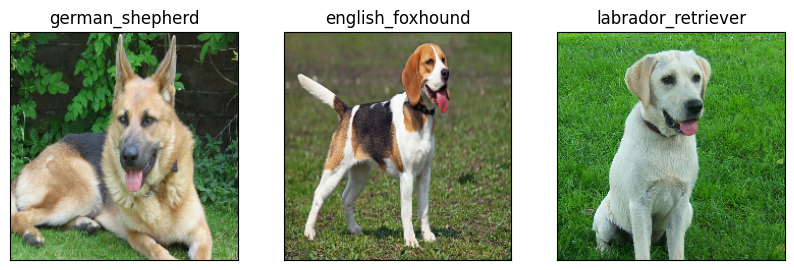

In [72]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.imshow(image)
  plt.title(custom_pred_labels[i])
  plt.xticks([])
  plt.yticks([])